# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [2]:
# from os import path
# from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
# platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())

# accelerator = 'cu80' if path.exists('/opt/bin/nvidia-smi') else 'cpu'

# !pip3 install -q http://download.pytorch.org/whl/{accelerator}/torch-0.4.0-{platform}-linux_x86_64.whl
# !pip3 install torchvision
!pip3 install pyro-ppl

    100% |████████████████████████████████| 215kB 30.7MB/s 
    100% |████████████████████████████████| 61kB 28.1MB/s 
  Stored in directory: /root/.cache/pip/wheels/65/89/2b/1e8facc32da9dbd01a6ad343300cd09a5506f538f4b6407a32
  Stored in directory: /root/.cache/pip/wheels/51/3e/a3/b351fae0cbf15373c2136a54a70f43fea5fe91d8168a5faaa4
Successfully built pyro-ppl opt-einsum


In [0]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

from functools import reduce

## Generating single value from normal distribution with given mean and variance

In [0]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(8.9480)


## Sampling from categorical probabilities with given probabilities

In [4]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(1)


## Animating data

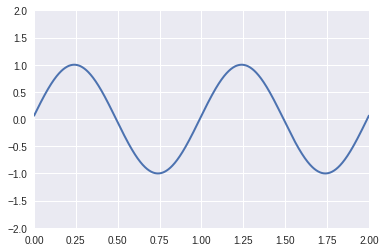

In [0]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 1000)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init,
                                   frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Drawing histogram

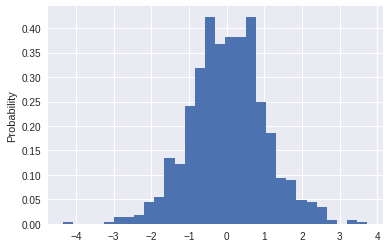

In [0]:
x = np.random.normal(size = 1000)
plt.hist(x, density=True, bins=30)
plt.ylabel('Probability');

## Task 1

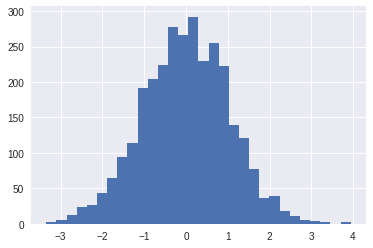

In [0]:
mean = 0
variance = 1

value_list = []

def animate():
  n_per_frame = 3
  number_of_frames = 1000
  data = []

  def update_hist(num, data):
    for i in range(n_per_frame):
      data.append(pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance)))
    plt.cla()
    plt.hist(data, bins=30)

  fig = plt.figure()
  hist = plt.hist(data, bins=30)

  anim = animation.FuncAnimation(fig, update_hist, number_of_frames, interval=10, fargs=(data, ) )
  return HTML(anim.to_jshtml())

animate()


## Task 2

In [0]:
## Insert solution here

In [0]:
def create_population(sick_number):
  population = []
  for s in range(sick_number):
    population.append(1)

  while len(population) < 50000:
    population.append(0)
  
  return population


def test_for_disease(real_value):
  if real_value == 0:
    error_probability = 0.02
    test_error = pyro.sample("categorical_sampling", pyro.distributions.Categorical(probs = torch.tensor([0.98, 0.02])))
  else:
    error_probability = 0.01
    test_error = pyro.sample("categorical_sampling", pyro.distributions.Categorical(probs = torch.tensor([0.99, 0.01])))

  if np.random.rand() < error_probability:
    test_value = abs(real_value - 1)
  else:
    test_value = real_value

  test_value = abs(real_value - test_error)

  return test_value

def run_single_simulation(sick_number, verbose=False):
  population = create_population(sick_number)
  results = [(p, test_for_disease(p)) for p in population]
  
  true_positives = len(list(filter(lambda x: x == (1, 1), results)))
  false_positives = len(list(filter(lambda x: x == (0, 1), results)))
  true_negatives = len(list(filter(lambda x: x == (0, 0), results)))
  false_negatives = len(list(filter(lambda x: x == (1, 0), results)))
  prob_true_positive = true_positives / (true_positives + false_positives)

  if verbose:
    print(f'Number of sick in population: {sick_number}')
    print('true_positives: ', true_positives)
    print('false_positives: ', false_positives)
    print('true_negatives: ', true_negatives)
    print('false_negatives: ', false_negatives)

    print()
    print(f'Probability of being sick with positive test result: {prob_true_positive * 100:.3}%')
  
#   print(test_results[:30])
  return prob_true_positive



In [55]:
# single simulation test

run_single_simulation(100)

0.09033423667570009

In [0]:
# bayes
def prob_bayes(infected):
  population = 50000
  p_pos = infected / population

  p_neg = 1 - p_pos

  p_pos_test_pos = 0.99
  p_neg_test_neg = 0.98
  p_neg_test_pos = 1 - p_neg_test_neg

  prob = p_pos * p_pos_test_pos / (p_pos_test_pos * p_pos + p_neg_test_pos * p_neg)

#   prob = (100 / 50000) * 0.98 / ((100 / 50000) * 0.98 + (1 - (100 / 50000)) * 0.01)
#   prob = (infected / 50000) * 0.99 / ((infected / 50000) * 0.99 + (1 - (infected / 50000)) * 0.02)
  return prob

In [0]:
# bulk test
samples = 3
results_sim = []
results_bayes = []

for sick_number in range(1, 101):
  results_bayes.append((sick_number, prob_bayes(sick_number)))
  for j in range(samples):
    results_sim.append((sick_number, run_single_simulation(sick_number)))

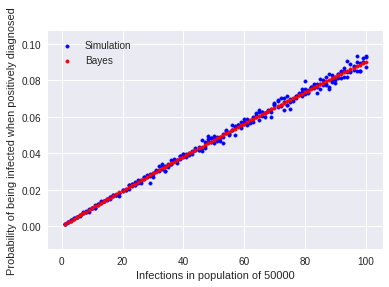

In [54]:
plt.scatter([x for (x,y) in results_sim], [y for (x,y) in results_sim], marker='.', color='blue', label='Simulation')
plt.scatter([x for (x,y) in results_bayes], [y for (x,y) in results_bayes], marker='.', color='red', label='Bayes')
plt.xlabel('Infections in population of 50000')
plt.ylabel('Probability of being infected when positively diagnosed')
plt.legend()